## Bike Rental Forecasting with Prophet

Prophet uses a linear model for its forecast.

In [59]:
## Loading required package
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
from warnings import filterwarnings
filterwarnings('ignore')

import numpy as np
import pandas as pd
from math import sqrt
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
import scipy.stats as stats

from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

np.random.seed(42)

In [25]:
# File path 
base_dir = '/Users/chrisjcc/Desktop/DataInsight/DataChallenge/Bike-Sharing-Dataset/'
data_path = base_dir + 'hour.csv'

# Load data
data = pd.read_csv(data_path, parse_dates=True, squeeze=True)

In [26]:
# Quick check of proper loading of dataset
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [27]:
# Preprocessing: Renaming columns names to more readable names
data.rename(columns={'instant':'rec_id',
                     'dteday':'ds',
                     'holiday':'is_holiday',
                     'workingday':'is_workingday',
                     'weathersit':'weather_condition',
                     'hum':'humidity',
                     'mnth':'month',
                     'cnt': 'y',
                     'hr':'hour',
                     'yr':'year',
                    },inplace=True)

In [28]:
# Setting proper data types

# date time conversion
data['ds'] = pd.to_datetime(data.ds)

# categorical fetures
data['season']     = data.season.astype('category')
data['is_holiday'] = data.is_holiday.astype('category')
data['weekday']    = data.weekday.astype('category')
data['weather_condition'] = data.weather_condition.astype('category')
data['is_workingday']     = data.is_workingday.astype('category')
data['month'] = data.month.astype('category')
data['hour']  = data.hour.astype('category')
data['year']  = data.year.astype('category')

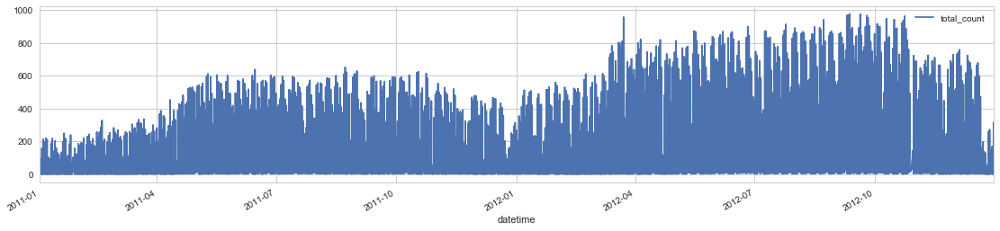

In [8]:
x = data[['DS', 'Y']].set_index(['datetime'])
x.plot(figsize=(19, 4))
plt.show()

In [44]:
x = data[['ds', 'y']]

### Additive model

By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. Prophet uses a linear model for its forecast.

In [45]:
# linear model for its forecast
m = Prophet(seasonality_mode='additive', daily_seasonality=True)
m.fit(x)

In [46]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
17739,2013-12-27
17740,2013-12-28
17741,2013-12-29
17742,2013-12-30
17743,2013-12-31


In [47]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
17739,2013-12-27,158.477868,-59.110833,387.650873
17740,2013-12-28,153.380183,-60.771007,375.751288
17741,2013-12-29,139.706526,-74.889854,349.430936
17742,2013-12-30,146.465146,-72.975541,361.524985
17743,2013-12-31,152.801809,-75.120227,377.673964


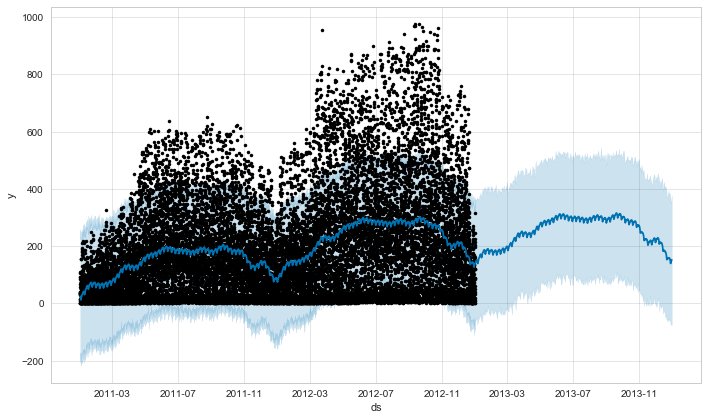

In [48]:
# plot the forecast 
fig1 = m.plot(forecast)

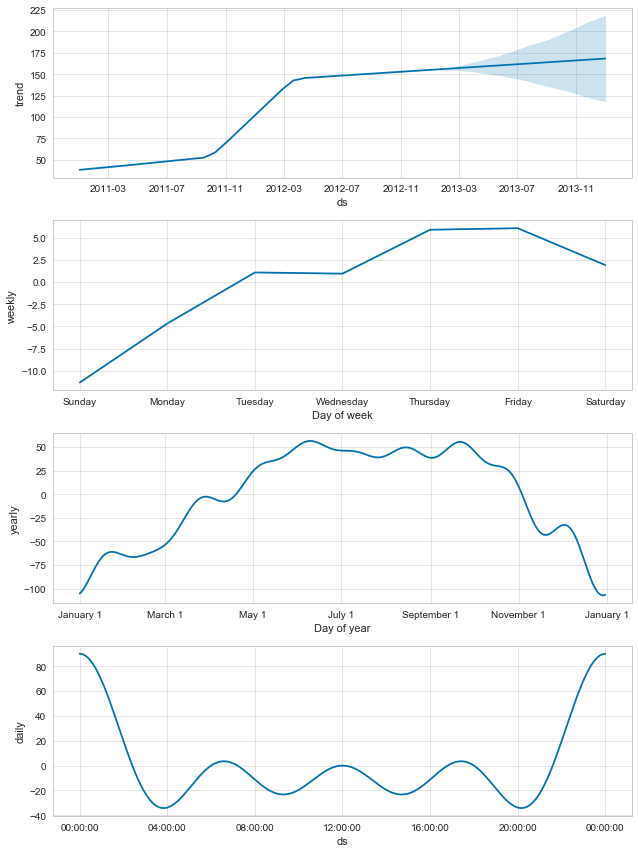

In [49]:
# to see the forecast components
fig2 = m.plot_components(forecast)

In [50]:
# interactive figure of the forecast
fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

###  Multiplicative model seasonality

In [51]:
m = Prophet(seasonality_mode='multiplicative', daily_seasonality=True)
m.fit(x)

In [52]:
forecast = m.predict(future)

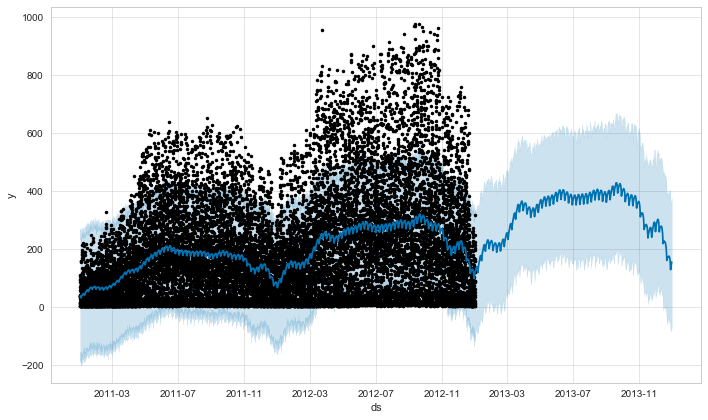

In [53]:
fig = m.plot(forecast)

The components figure will now show the seasonality as a percent of the trend.

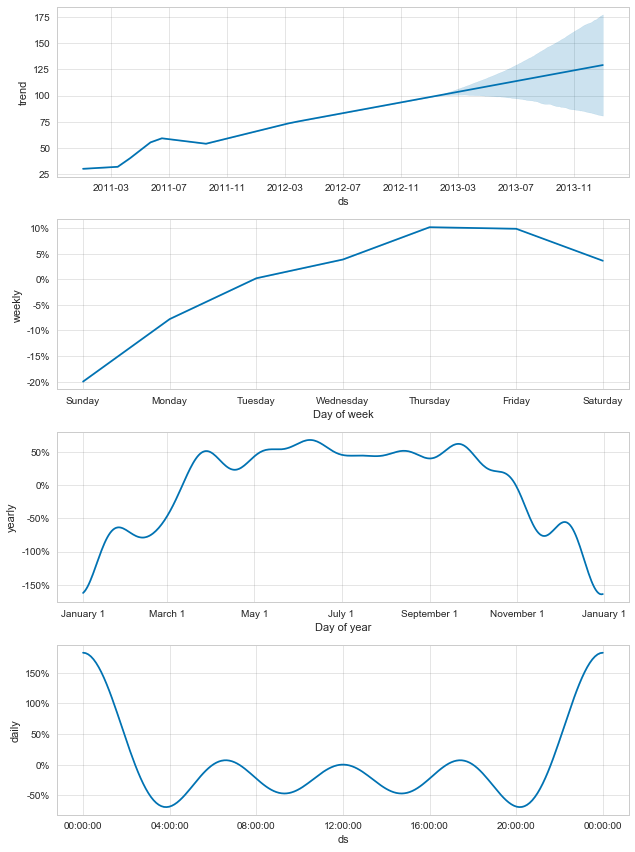

In [54]:
# to see the forecast components
fig2 = m.plot_components(forecast)

With seasonality_mode='multiplicative', holiday effects will also be modeled as multiplicative. Any added seasonalities or extra regressors will by default use whatever seasonality_mode is set to, but can be overriden by specifying mode='additive' or mode='multiplicative' as an argument when adding the seasonality or regressor.

In [ ]:
m = Prophet(seasonality_mode='multiplicative')
m.add_seasonality('quarterly', period=91.25, fourier_order=8, mode='additive')
m.add_regressor('regressor', mode='additive')

Additive and multiplicative extra regressors will show up in separate panels on the components plot.

In [55]:
# cross-validated performance

#df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')
df_cv = cross_validation(m, initial='365 days', period='180 days', horizon = '180 days')
df_cv.head()

INFO:fbprophet:Making 2 forecasts with cutoffs between 2012-01-06 00:00:00 and 2012-07-04 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2012-01-07,119.451067,-44.113979,269.777119,512,2012-01-06
1,2012-01-07,119.451067,-41.075696,287.405209,449,2012-01-06
2,2012-01-07,119.451067,-38.281302,279.883525,401,2012-01-06
3,2012-01-07,119.451067,-39.722571,275.226474,322,2012-01-06
4,2012-01-07,119.451067,-33.145573,275.252704,215,2012-01-06


Here we do cross-validation to assess prediction performance on a horizon of 365 days, starting with 730 days of training data in the first cutoff and then making predictions every 180 days. On this 8 year time series, this corresponds to 11 total forecasts.

In [56]:
# model performance
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,coverage
0,18 days,29001.113139,170.297132,128.664916,6.623956,0.755602
1,19 days,29575.825442,171.976235,129.201142,6.861947,0.757640
2,20 days,31049.146451,176.207680,131.300841,6.803611,0.754875
3,21 days,33089.568998,181.905385,134.800431,6.784881,0.750303
4,22 days,34030.660705,184.474011,136.833474,6.727447,0.742627


We compute some useful statistics of the prediction performance (yhat, yhat_lower, and yhat_upper compared to y), as a function of the distance from the cutoff (how far into the future the prediction was). The statistics computed are mean squared error (MSE), root mean squared error (RMSE), mean absolute error (MAE), mean absolute percent error (MAPE), and coverage of the yhat_lower and yhat_upper estimates. These are computed on a rolling window of the predictions in df_cv after sorting by horizon (ds minus cutoff). By default 10% of the predictions will be included in each window, but this can be changed with the rolling_window argument.

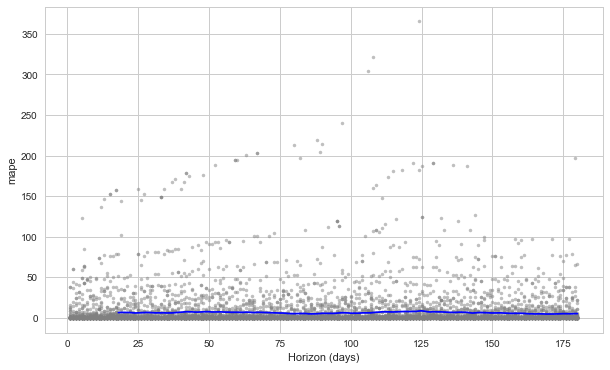

In [57]:
# cross-validaiton model evaluation
fig = plot_cross_validation_metric(df_cv, metric='mape')

The blue line shows the MAPE, where the mean is taken over a rolling window of the dots. We see for this forecast that errors around 5% are typical for predictions one month into the future, and that errors increase up to around 11% for predictions that are a year out.

The size of the rolling window in the figure can be changed with the optional argument rolling_window, which specifies the proportion of forecasts to use in each rolling window. The default is 0.1, corresponding to 10% of rows from df_cv included in each window; increasing this will lead to a smoother average curve in the figure.

The initial period should be long enough to capture all of the components of the model, in particular seasonalities and extra regressors: at least a year for yearly seasonality, at least a week for weekly seasonality, etc.

### Automatic trend changepoint detection in Prophet

Prophet detects changepoints by first specifying a large number of potential changepoints at which the rate is allowed to change. It then puts a sparse prior on the magnitudes of the rate changes (equivalent to L1 regularization) - this essentially means that Prophet has a large number of possible places where the rate can change, but will use as few of them as possible.

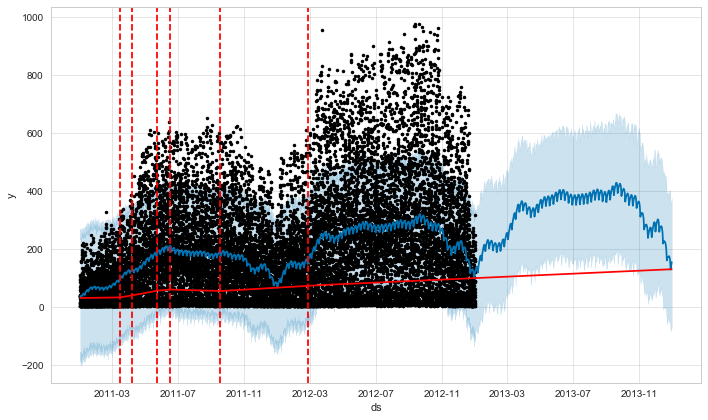

In [60]:
from fbprophet.plot import add_changepoints_to_plot

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


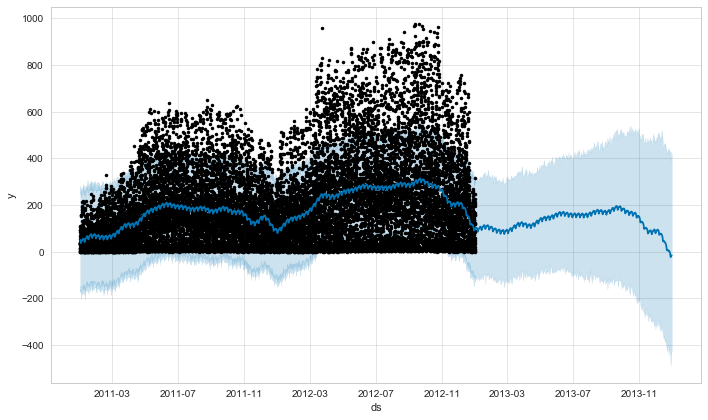

In [62]:
m = Prophet(changepoint_prior_scale=0.5, daily_seasonality=True)
forecast = m.fit(x).predict(future)
fig = m.plot(forecast)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


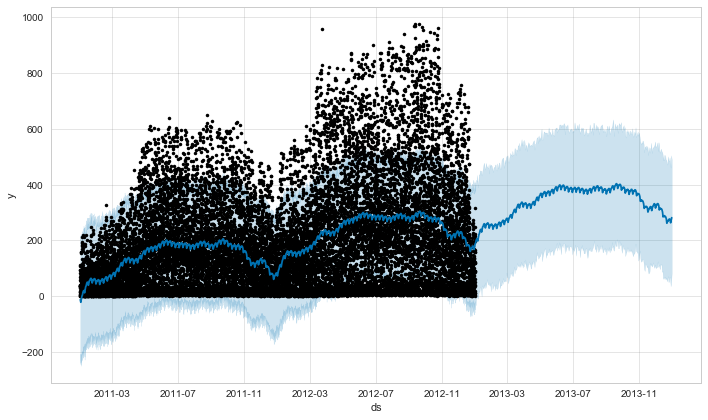

In [63]:
m = Prophet(changepoint_prior_scale=0.001, daily_seasonality=True)
forecast = m.fit(x).predict(future)
fig = m.plot(forecast)